# PA Quantum Neuron

Build a classical neuron with a quantum circuit

In [1]:
from colorama import Fore, Back, Style 

import numpy as numpy
from pennylane import numpy as np
import pennylane as qml
from pennylane.optimize import NesterovMomentumOptimizer
from pennylane.math import requires_grad

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score

from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC

from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

from math import pi


# Quantum

In [2]:
max_iterations = 400
loop_count = 13

In [3]:

dev_1 = qml.device('default.qubit', wires=2)
dev_2 = qml.device('default.qubit', wires=2)
dev_3 = qml.device('default.qubit', wires=2)

## Classifier 1
init_weights_1 = (0.01 * np.random.randn(6*3), 0.0)

@qml.qnode(dev_1)
def circuit_1(weights, data):
    qml.Hadamard(0)
    qml.Hadamard(1)
    
    # layer 1
    qml.RY(data[0], wires=0) # input feature 1
    qml.RY(data[1], wires=1) # input feature 2
    
    qml.CNOT(wires=[0, 1])

    qml.Rot(weights[0], weights[1], weights[2], wires=0)
    qml.Rot(weights[3], weights[4], weights[5], wires=1)
    
    qml.CNOT(wires=[0, 1])

    # layer 2
    qml.RY(data[0], wires=0) # input feature 1
    qml.RY(data[1], wires=1) # input feature 2
    
    qml.CNOT(wires=[0, 1])

    qml.Rot(weights[6], weights[7], weights[8], wires=0)
    qml.Rot(weights[9], weights[10], weights[11], wires=1)
    
    qml.CNOT(wires=[0, 1])

    # layer 3
    qml.RY(data[0], wires=0) # input feature 1
    qml.RY(data[1], wires=1) # input feature 2
    
    qml.CNOT(wires=[0, 1])

    qml.Rot(weights[12], weights[13], weights[14], wires=0)
    qml.Rot(weights[15], weights[16], weights[17], wires=1)
    
    qml.CNOT(wires=[0, 1])
    
    return qml.expval(qml.PauliZ(0))

def vc_classifier_1(var, data):
    weights = var[0]
    bias = var[1]
    return circuit_1(weights, data) + bias


## Classifier 2
init_weights_2 = (0.01 * np.random.randn(6*3), 0.0)

@qml.qnode(dev_2)
def circuit_2(weights, data):
    qml.Hadamard(0)
    qml.Hadamard(1)
    
    # layer 1
    qml.RY(data[0], wires=0) # input feature 1
    qml.RX(data[1], wires=0) # input feature 2
    
    qml.CNOT(wires=[0, 1])
    
    qml.Rot(weights[0], weights[1], weights[2], wires=0)
    qml.Rot(weights[3], weights[4], weights[5], wires=1)
    
    qml.CNOT(wires=[0, 1])
    
    # layer 2
    qml.RY(data[0], wires=0) # input feature 1
    qml.RX(data[1], wires=0) # input feature 2
    
    qml.CNOT(wires=[0, 1])
    
    qml.Rot(weights[6], weights[7], weights[8], wires=0)
    qml.Rot(weights[9], weights[10], weights[11], wires=1)
    
    qml.CNOT(wires=[0, 1])
    
    # layer 3
    qml.RY(data[0], wires=0) # input feature 1
    qml.RX(data[1], wires=0) # input feature 2
    
    qml.CNOT(wires=[0, 1])
    
    qml.Rot(weights[12], weights[13], weights[14], wires=0)
    qml.Rot(weights[15], weights[16], weights[17], wires=1)
    
    qml.CNOT(wires=[0, 1])


    return qml.expval(qml.PauliZ(0))

def vc_classifier_2(var, data):
    weights = var[0]
    bias = var[1]
    return circuit_2(weights, data) + bias
  

## Classifier 3
init_weights_3 = (0.01 * np.random.randn(6*3), 0.0)

@qml.qnode(dev_3)
def circuit_3(weights, data):
    qml.Hadamard(0)
    qml.Hadamard(1)
    
    # layer 1
    qml.RY(data[0], wires=0) # input feature 1
    qml.RX(data[1], wires=1) # input feature 2
    
    qml.CNOT(wires=[0, 1])
    
    qml.Rot(weights[0], weights[1], weights[2], wires=0)
    qml.Rot(weights[3], weights[4], weights[5], wires=1)
    
    qml.CNOT(wires=[0, 1])
    
    # layer 2
    qml.RY(data[0], wires=0) # input feature 1
    qml.RX(data[1], wires=1) # input feature 2
    
    qml.CNOT(wires=[0, 1])
    
    qml.Rot(weights[6], weights[7], weights[8], wires=0)
    qml.Rot(weights[9], weights[10], weights[11], wires=1)
    
    qml.CNOT(wires=[0, 1])
    
    # layer 3
    qml.RY(data[0], wires=0) # input feature 1
    qml.RX(data[1], wires=1) # input feature 2
    
    qml.CNOT(wires=[0, 1])
    
    qml.Rot(weights[12], weights[13], weights[14], wires=0)
    qml.Rot(weights[15], weights[16], weights[17], wires=1)
    
    qml.CNOT(wires=[0, 1])
    
    return qml.expval(qml.PauliZ(0))

def vc_classifier_3(var, data):
    weights = var[0]
    bias = var[1]
    return circuit_3(weights, data) + bias


## generic
def square_loss(labels, predictions):
    loss = 0
    for l, p in zip(labels, predictions):
        loss = loss + (l - p) ** 2
    loss = loss / len(labels)
    return loss

def cost(vc_classifier, weights, datas, labels):
    predictions = [vc_classifier(weights, f) for f in datas]
    return square_loss(labels, predictions)

def accuracy(labels, predictions):
    loss = 0
    for l, p in zip(labels, predictions):
        if abs(l - p) < 1e-5:
            loss = loss + 1
    loss = loss / len(labels)
    return loss
  
def plot_costs(costs, num_layers):
  # plot costs
   fig, (ax1) = plt.subplots(1)
   fig.suptitle('Costs')
   ax1.plot(range(len(costs)), costs, label='Layers: {}'.format(num_layers))
   ax1.set_xlabel('iteration number')
   ax1.set_ylabel('cost objective function')
   ax1.legend(loc="upper right")
   plt.show()

# init weights
# var_init = (0.01 * np.random.randn(1, 2, 3), 0.0)


In [4]:
def vc_quantum(vc_classifier, init_weights, x_train, x_test, X, y_train, y_test, Y):
  opt = NesterovMomentumOptimizer(0.01)
  batch_size = 5
  var = init_weights
  iterations = max_iterations
  costs = np.zeros(iterations) 

  for it in range(iterations):

      # Update the weights by one optimizer step
      batch_index = np.random.randint(0, len(x_train), (batch_size,))
      feats_train_batch = x_train[batch_index]
      Y_train_batch = y_train[batch_index]
      var, stepCost = opt.step_and_cost(lambda v: cost(vc_classifier, v, feats_train_batch, Y_train_batch), var)

      # Compute predictions on train and validation set
      predictions_train = [np.sign(vc_classifier(var, f)) for f in x_train]
      predictions_val = [np.sign(vc_classifier(var, f)) for f in x_test]
      predictions_all = [np.sign(vc_classifier(var, f)) for f in X]

      # Compute accuracy on train and validation set
      acc_train = accuracy(y_train, predictions_train)
      acc_val = accuracy(y_test, predictions_val)
      acc_all = accuracy(Y, predictions_all)

      # gather informations for plotting
      costs[it] = cost(vc_classifier, var, X, Y)

      print(
          "Iter: {:5d} | Cost: {:0.7f} | Acc train: {:0.7f} | Acc val: {:0.7f} | Acc all: {:0.7f} "
          "".format(it + 1, costs[it], acc_train, acc_val, acc_all)
      )
  
  return [var, acc_val]

# plot costs
# plot_costs(costs, 0)

Loop count: 0


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8774598 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8792373 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     3 | Cost: 0.8775228 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8752644 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8723744 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8636573 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8539382 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8451733 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     9 | Cost: 0.8367421 | Acc train: 0.6933333 | Acc val: 0.6400000 | Acc all: 0.7200000 
Iter:    10 | Cost: 0.8286414 | Acc train: 0.7200000 | Acc val: 0.6400000 | Acc all: 0.7200000 
Iter:    11 | Cost: 0.8230296 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5168369 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     2 | Cost: 1.5184181 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     3 | Cost: 1.5167513 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     4 | Cost: 1.5118831 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     5 | Cost: 1.5104876 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     6 | Cost: 1.5088875 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     7 | Cost: 1.5090165 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     8 | Cost: 1.5024531 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     9 | Cost: 1.4971254 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    10 | Cost: 1.4956213 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:    11 | Cost: 1.4887481 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2228729 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2228620 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2224682 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2234432 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2241019 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2233395 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     7 | Cost: 1.2220936 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     8 | Cost: 1.2216301 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     9 | Cost: 1.2246144 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:    10 | Cost: 1.2315000 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:    11 | Cost: 1.2439286 | Acc trai

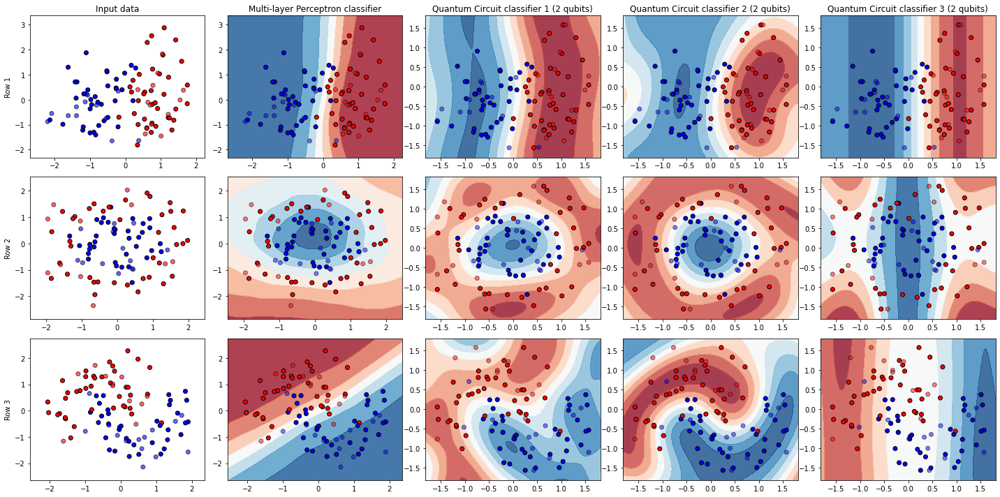

Loop count: 1


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8762693 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8745372 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     3 | Cost: 0.8724368 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8683032 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8667285 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8613683 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8586011 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8548287 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     9 | Cost: 0.8503321 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    10 | Cost: 0.8457421 | Acc train: 0.7200000 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    11 | Cost: 0.8375171 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5073460 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5043487 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.4987333 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.4968085 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     5 | Cost: 1.4970686 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     6 | Cost: 1.4899367 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     7 | Cost: 1.4825547 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     8 | Cost: 1.4758364 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     9 | Cost: 1.4606724 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    10 | Cost: 1.4458148 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    11 | Cost: 1.4243378 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2216912 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2206823 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2208023 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     4 | Cost: 1.2239540 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     5 | Cost: 1.2308451 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     6 | Cost: 1.2443464 | Acc train: 0.5866667 | Acc val: 0.4800000 | Acc all: 0.5700000 
Iter:     7 | Cost: 1.2617549 | Acc train: 0.5600000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     8 | Cost: 1.2846114 | Acc train: 0.5733333 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:     9 | Cost: 1.3032603 | Acc train: 0.5733333 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:    10 | Cost: 1.3196201 | Acc train: 0.5733333 | Acc val: 0.4800000 | Acc all: 0.5600000 
Iter:    11 | Cost: 1.3479338 | Acc trai

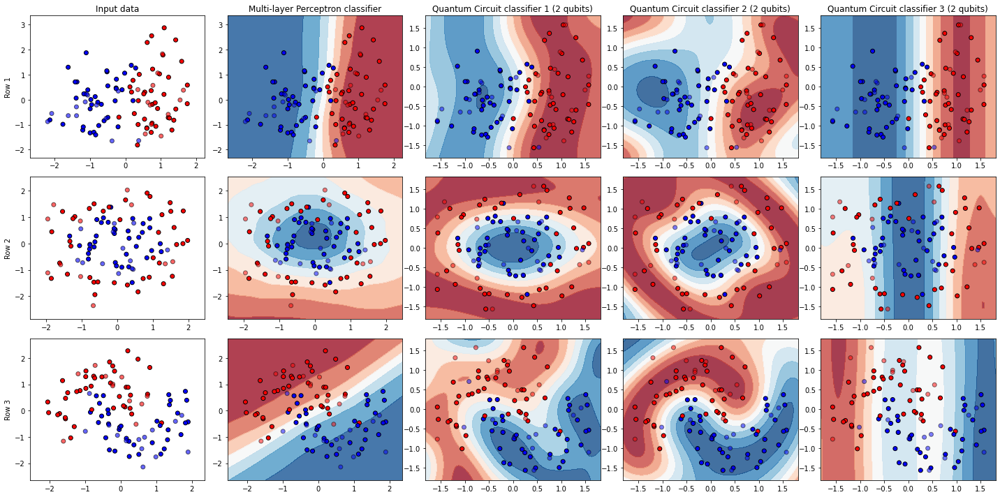

Loop count: 2


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8790905 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8770269 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     3 | Cost: 0.8760126 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8757490 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     5 | Cost: 0.8718559 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8695277 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7400000 
Iter:     7 | Cost: 0.8659211 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8626732 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7400000 
Iter:     9 | Cost: 0.8589129 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7400000 
Iter:    10 | Cost: 0.8563758 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7400000 
Iter:    11 | Cost: 0.8540734 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5085420 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5003042 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.4920400 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.4859869 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     5 | Cost: 1.4794715 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     6 | Cost: 1.4709757 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     7 | Cost: 1.4621719 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     8 | Cost: 1.4505501 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     9 | Cost: 1.4375896 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:    10 | Cost: 1.4203463 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:    11 | Cost: 1.4060917 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2218668 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2207224 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2206222 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     4 | Cost: 1.2223202 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     5 | Cost: 1.2257209 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     6 | Cost: 1.2327033 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     7 | Cost: 1.2404503 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     8 | Cost: 1.2473296 | Acc train: 0.5866667 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     9 | Cost: 1.2532891 | Acc train: 0.5866667 | Acc val: 0.5200000 | Acc all: 0.5600000 
Iter:    10 | Cost: 1.2584683 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5700000 
Iter:    11 | Cost: 1.2646465 | Acc trai

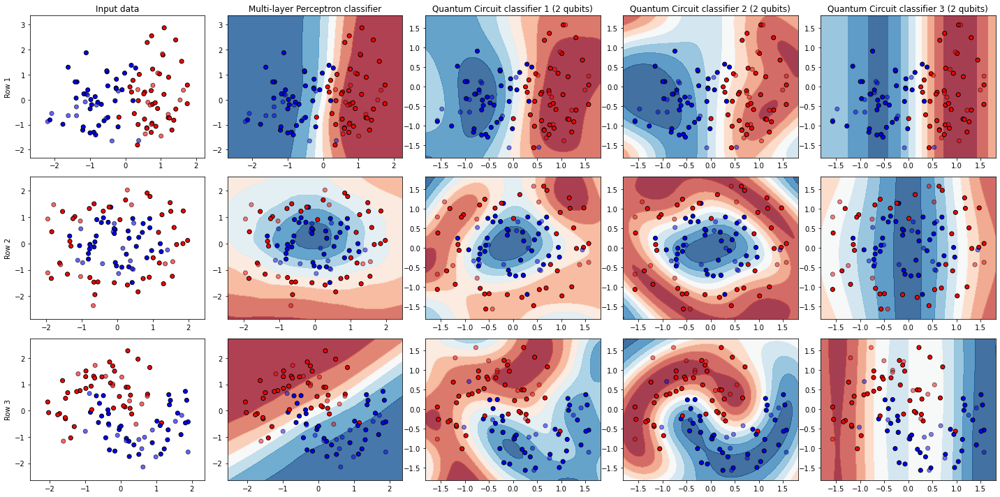

Loop count: 3


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8800920 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8770084 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     3 | Cost: 0.8776738 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     4 | Cost: 0.8778871 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7200000 
Iter:     5 | Cost: 0.8772993 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8721658 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     7 | Cost: 0.8683927 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7100000 
Iter:     8 | Cost: 0.8638334 | Acc train: 0.7466667 | Acc val: 0.6800000 | Acc all: 0.7100000 
Iter:     9 | Cost: 0.8636626 | Acc train: 0.7600000 | Acc val: 0.6800000 | Acc all: 0.7200000 
Iter:    10 | Cost: 0.8669339 | Acc train: 0.7600000 | Acc val: 0.6800000 | Acc all: 0.7300000 
Iter:    11 | Cost: 0.8753309 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5101344 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5093102 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.5137840 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     4 | Cost: 1.5153436 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     5 | Cost: 1.5176031 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     6 | Cost: 1.5268105 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5000000 
Iter:     7 | Cost: 1.5346877 | Acc train: 0.4933333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     8 | Cost: 1.5397124 | Acc train: 0.4933333 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     9 | Cost: 1.5421629 | Acc train: 0.5066667 | Acc val: 0.5600000 | Acc all: 0.5200000 
Iter:    10 | Cost: 1.5300247 | Acc train: 0.5066667 | Acc val: 0.5200000 | Acc all: 0.5300000 
Iter:    11 | Cost: 1.5230764 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2218872 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2218806 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2213551 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2202507 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2189919 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2183405 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     7 | Cost: 1.2189432 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     8 | Cost: 1.2213590 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     9 | Cost: 1.2271840 | Acc train: 0.5866667 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:    10 | Cost: 1.2315734 | Acc train: 0.5600000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    11 | Cost: 1.2315242 | Acc trai

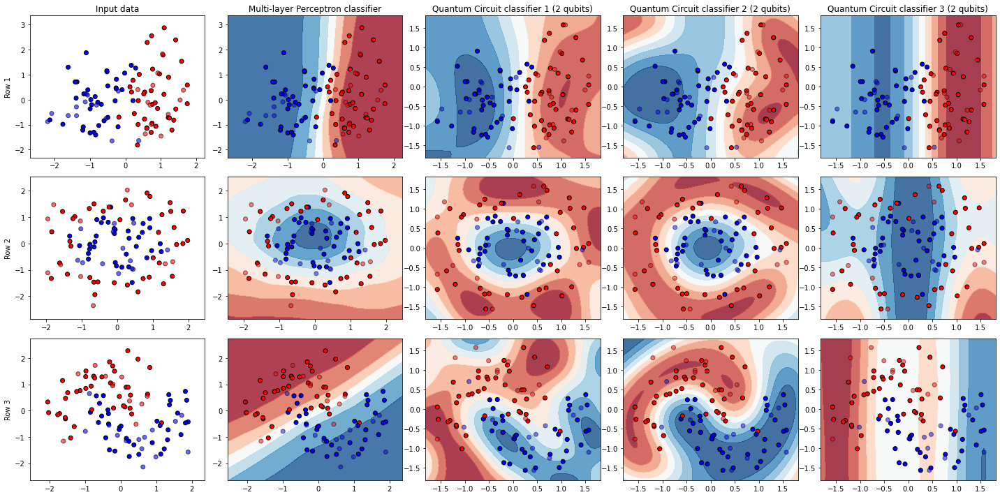

Loop count: 4


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8758456 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8748393 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     3 | Cost: 0.8741649 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8749675 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8764079 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     6 | Cost: 0.8795545 | Acc train: 0.7066667 | Acc val: 0.6000000 | Acc all: 0.7000000 
Iter:     7 | Cost: 0.8777047 | Acc train: 0.7200000 | Acc val: 0.6400000 | Acc all: 0.7000000 
Iter:     8 | Cost: 0.8801041 | Acc train: 0.7066667 | Acc val: 0.6400000 | Acc all: 0.7000000 
Iter:     9 | Cost: 0.8789912 | Acc train: 0.7066667 | Acc val: 0.6400000 | Acc all: 0.7000000 
Iter:    10 | Cost: 0.8805099 | Acc train: 0.7066667 | Acc val: 0.6400000 | Acc all: 0.7000000 
Iter:    11 | Cost: 0.8852515 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5105298 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5096813 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.5035467 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.4955272 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     5 | Cost: 1.4886030 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     6 | Cost: 1.4787324 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     7 | Cost: 1.4685378 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     8 | Cost: 1.4520738 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     9 | Cost: 1.4312594 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    10 | Cost: 1.4078598 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    11 | Cost: 1.3882229 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2215496 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2210882 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     3 | Cost: 1.2207408 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     4 | Cost: 1.2213662 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     5 | Cost: 1.2220332 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     6 | Cost: 1.2227490 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     7 | Cost: 1.2245687 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     8 | Cost: 1.2266079 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5700000 
Iter:     9 | Cost: 1.2287504 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:    10 | Cost: 1.2299718 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:    11 | Cost: 1.2306731 | Acc trai

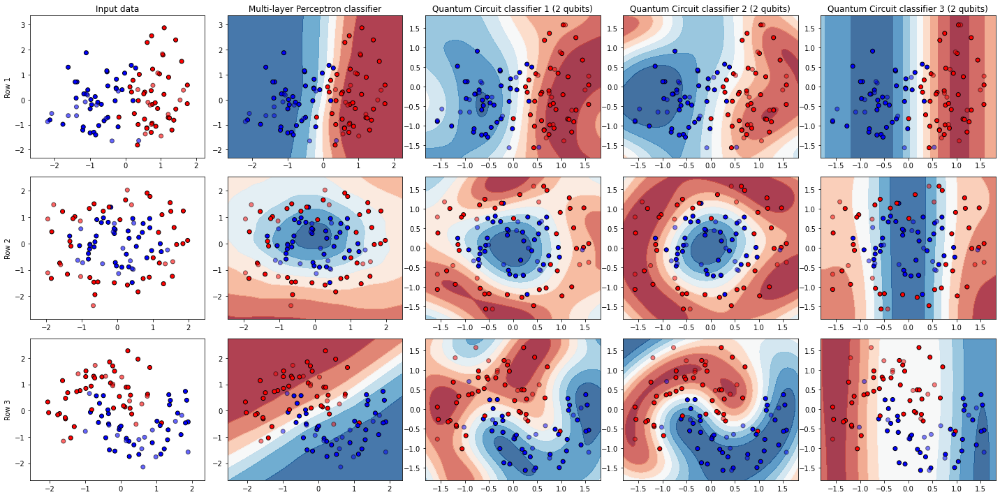

Loop count: 5


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8733179 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     2 | Cost: 0.8685783 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     3 | Cost: 0.8591054 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8508263 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8447531 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8411568 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8357261 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8299947 | Acc train: 0.7200000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     9 | Cost: 0.8196697 | Acc train: 0.6933333 | Acc val: 0.6400000 | Acc all: 0.7200000 
Iter:    10 | Cost: 0.8130340 | Acc train: 0.7066667 | Acc val: 0.6400000 | Acc all: 0.7200000 
Iter:    11 | Cost: 0.8077009 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5070795 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.4993136 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.4914794 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.4808685 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     5 | Cost: 1.4694309 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     6 | Cost: 1.4567934 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     7 | Cost: 1.4463682 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     8 | Cost: 1.4385846 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     9 | Cost: 1.4303746 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:    10 | Cost: 1.4205284 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:    11 | Cost: 1.4058221 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2223755 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2218659 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2203315 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2198792 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2200888 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2212132 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     7 | Cost: 1.2214763 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     8 | Cost: 1.2226159 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     9 | Cost: 1.2237107 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:    10 | Cost: 1.2236214 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5600000 
Iter:    11 | Cost: 1.2217560 | Acc trai

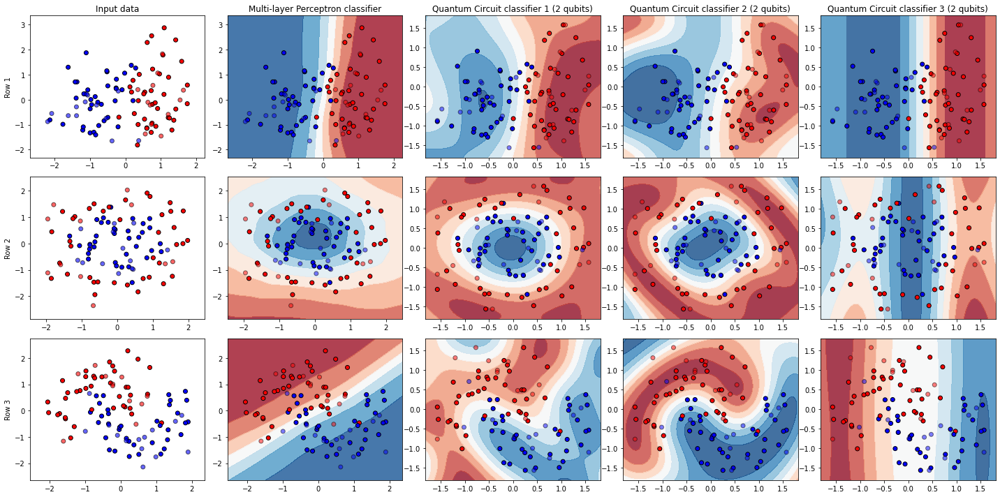

Loop count: 6


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8768016 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8766930 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     3 | Cost: 0.8765835 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8772128 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8767083 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8751019 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8711525 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8663457 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     9 | Cost: 0.8610992 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    10 | Cost: 0.8577141 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    11 | Cost: 0.8534198 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5135911 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5147397 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.5157332 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.5163927 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     5 | Cost: 1.5204023 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     6 | Cost: 1.5241212 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     7 | Cost: 1.5272132 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     8 | Cost: 1.5303778 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     9 | Cost: 1.5365738 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:    10 | Cost: 1.5443766 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:    11 | Cost: 1.5448388 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2220286 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2213642 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2197327 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2196437 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     5 | Cost: 1.2218671 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2236414 | Acc train: 0.5600000 | Acc val: 0.4800000 | Acc all: 0.5600000 
Iter:     7 | Cost: 1.2259856 | Acc train: 0.5733333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     8 | Cost: 1.2265212 | Acc train: 0.5733333 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     9 | Cost: 1.2284043 | Acc train: 0.5600000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:    10 | Cost: 1.2267274 | Acc train: 0.5733333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:    11 | Cost: 1.2218675 | Acc trai

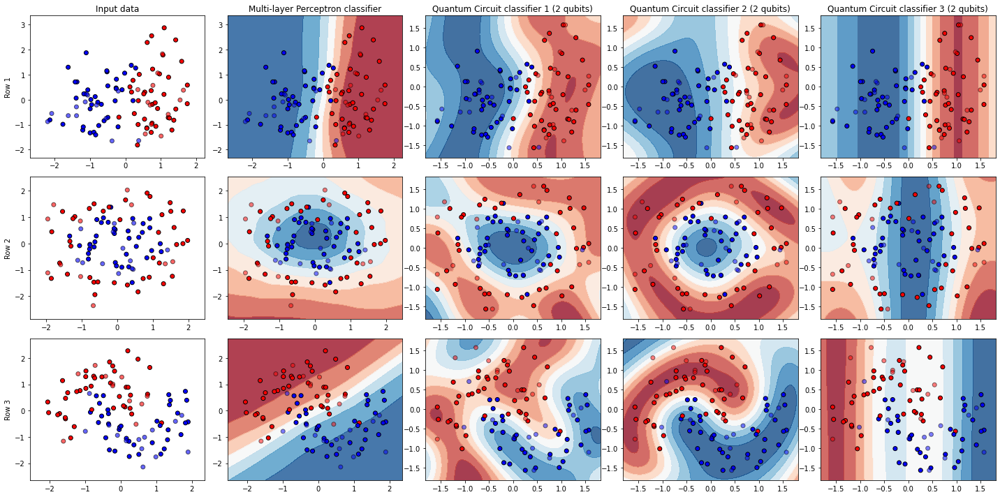

Loop count: 7


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8769523 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8752373 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     3 | Cost: 0.8733583 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8718361 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8717837 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8737931 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8776665 | Acc train: 0.7200000 | Acc val: 0.6800000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8748131 | Acc train: 0.7200000 | Acc val: 0.6800000 | Acc all: 0.7200000 
Iter:     9 | Cost: 0.8687189 | Acc train: 0.7200000 | Acc val: 0.6800000 | Acc all: 0.7300000 
Iter:    10 | Cost: 0.8630715 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:    11 | Cost: 0.8548340 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5048111 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.4968181 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     3 | Cost: 1.4765799 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     4 | Cost: 1.4538056 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     5 | Cost: 1.4316194 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     6 | Cost: 1.4129287 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     7 | Cost: 1.3987880 | Acc train: 0.5200000 | Acc val: 0.5200000 | Acc all: 0.5300000 
Iter:     8 | Cost: 1.3791318 | Acc train: 0.5200000 | Acc val: 0.5200000 | Acc all: 0.5400000 
Iter:     9 | Cost: 1.3629067 | Acc train: 0.5333333 | Acc val: 0.5200000 | Acc all: 0.5300000 
Iter:    10 | Cost: 1.3389456 | Acc train: 0.5200000 | Acc val: 0.5200000 | Acc all: 0.5500000 
Iter:    11 | Cost: 1.3212020 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2230178 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2219974 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2207810 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2198133 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2213105 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     6 | Cost: 1.2246701 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     7 | Cost: 1.2297871 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5700000 
Iter:     8 | Cost: 1.2405574 | Acc train: 0.5600000 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:     9 | Cost: 1.2536337 | Acc train: 0.5600000 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:    10 | Cost: 1.2703685 | Acc train: 0.5600000 | Acc val: 0.4400000 | Acc all: 0.5400000 
Iter:    11 | Cost: 1.2880443 | Acc trai

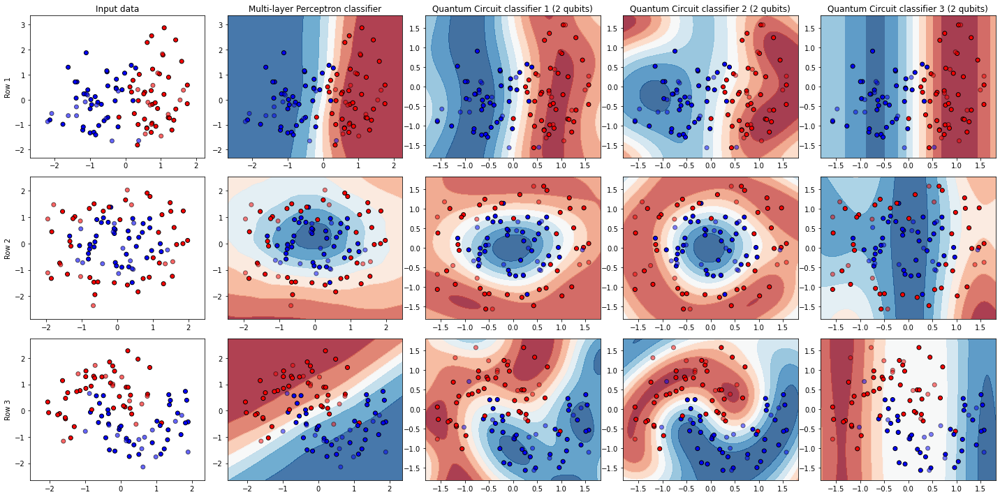

Loop count: 8


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8779953 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8784244 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     3 | Cost: 0.8767595 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7200000 
Iter:     4 | Cost: 0.8742311 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     5 | Cost: 0.8704951 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     6 | Cost: 0.8645125 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     7 | Cost: 0.8571281 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     8 | Cost: 0.8501981 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     9 | Cost: 0.8442954 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:    10 | Cost: 0.8452152 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7500000 
Iter:    11 | Cost: 0.8473792 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5142246 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5124049 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.5082252 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.5067054 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     5 | Cost: 1.4999753 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     6 | Cost: 1.4896469 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     7 | Cost: 1.4819196 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5000000 
Iter:     8 | Cost: 1.4750480 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5100000 
Iter:     9 | Cost: 1.4686598 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:    10 | Cost: 1.4593641 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:    11 | Cost: 1.4471429 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2227850 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2216472 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2205706 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2200874 | Acc train: 0.6266667 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2194387 | Acc train: 0.6000000 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2177911 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     7 | Cost: 1.2164135 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     8 | Cost: 1.2151148 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5900000 
Iter:     9 | Cost: 1.2136843 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:    10 | Cost: 1.2127245 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:    11 | Cost: 1.2118761 | Acc trai

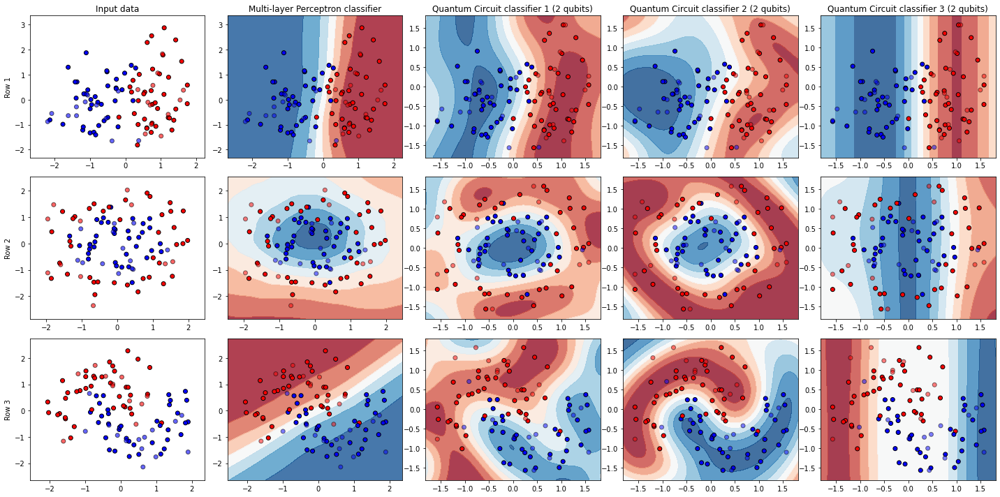

Loop count: 9


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8729677 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8697378 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     3 | Cost: 0.8642181 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8569467 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8492739 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8386359 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8278242 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     8 | Cost: 0.8170511 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:     9 | Cost: 0.8039021 | Acc train: 0.7066667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:    10 | Cost: 0.7909637 | Acc train: 0.7200000 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    11 | Cost: 0.7808810 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5125796 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5122775 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.5088797 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.5001967 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     5 | Cost: 1.4892324 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     6 | Cost: 1.4773029 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     7 | Cost: 1.4636488 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     8 | Cost: 1.4535050 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     9 | Cost: 1.4412785 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:    10 | Cost: 1.4286604 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    11 | Cost: 1.4220145 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2240914 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2258192 | Acc train: 0.6000000 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     3 | Cost: 1.2262594 | Acc train: 0.6000000 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2298596 | Acc train: 0.6000000 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2335368 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2380495 | Acc train: 0.6000000 | Acc val: 0.5600000 | Acc all: 0.5900000 
Iter:     7 | Cost: 1.2348742 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5800000 
Iter:     8 | Cost: 1.2351894 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5800000 
Iter:     9 | Cost: 1.2356995 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5800000 
Iter:    10 | Cost: 1.2371236 | Acc train: 0.6000000 | Acc val: 0.5600000 | Acc all: 0.5700000 
Iter:    11 | Cost: 1.2366337 | Acc trai

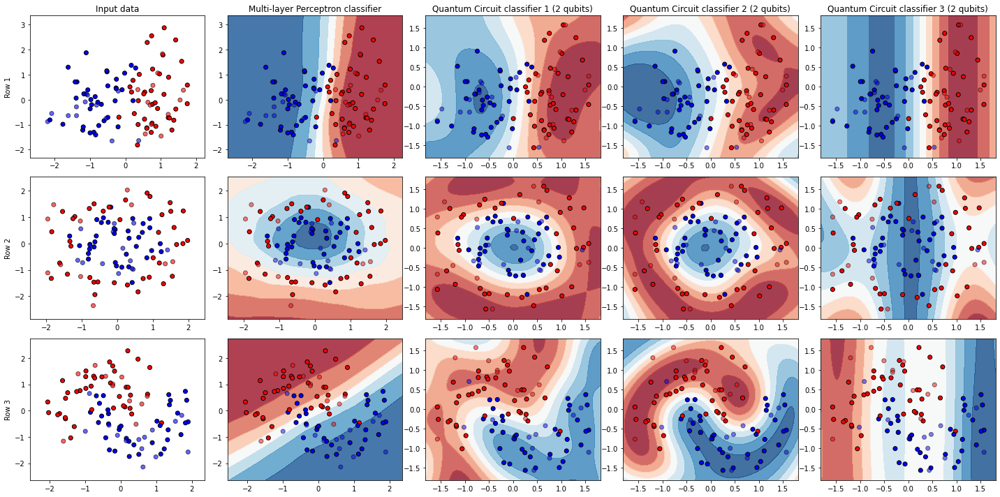

Loop count: 10


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8759483 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8751404 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     3 | Cost: 0.8712724 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8685616 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8659692 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8631875 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8569961 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8541284 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     9 | Cost: 0.8472332 | Acc train: 0.7333333 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:    10 | Cost: 0.8345732 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    11 | Cost: 0.8209695 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5087506 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.4999226 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.4876556 | Acc train: 0.5066667 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     4 | Cost: 1.4770880 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     5 | Cost: 1.4696795 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     6 | Cost: 1.4599443 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     7 | Cost: 1.4491723 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     8 | Cost: 1.4398574 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:     9 | Cost: 1.4253752 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:    10 | Cost: 1.4056590 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:    11 | Cost: 1.3806026 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2217865 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2204910 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2202019 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2202532 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2206135 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     6 | Cost: 1.2214054 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     7 | Cost: 1.2222818 | Acc train: 0.6133333 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     8 | Cost: 1.2228589 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5800000 
Iter:     9 | Cost: 1.2241791 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5700000 
Iter:    10 | Cost: 1.2259234 | Acc train: 0.6000000 | Acc val: 0.4800000 | Acc all: 0.5700000 
Iter:    11 | Cost: 1.2273152 | Acc trai

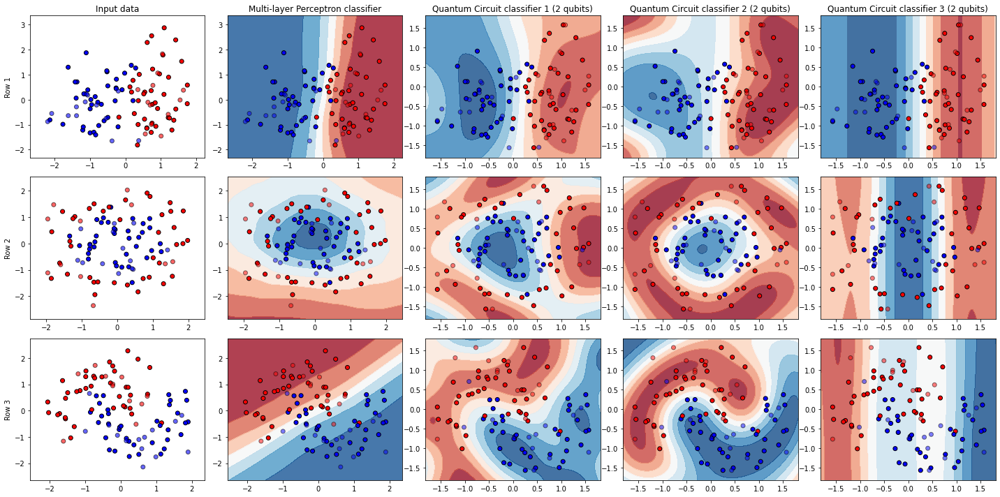

Loop count: 11


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8783127 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8779278 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     3 | Cost: 0.8778152 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     4 | Cost: 0.8766728 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     5 | Cost: 0.8750941 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     6 | Cost: 0.8698320 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     7 | Cost: 0.8639095 | Acc train: 0.7600000 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8560640 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7300000 
Iter:     9 | Cost: 0.8502653 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    10 | Cost: 0.8437197 | Acc train: 0.7466667 | Acc val: 0.6400000 | Acc all: 0.7400000 
Iter:    11 | Cost: 0.8356587 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5055969 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5039064 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     3 | Cost: 1.5011377 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     4 | Cost: 1.4985496 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     5 | Cost: 1.4971658 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     6 | Cost: 1.4863976 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     7 | Cost: 1.4752761 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     8 | Cost: 1.4591864 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:     9 | Cost: 1.4475112 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:    10 | Cost: 1.4363448 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5500000 
Iter:    11 | Cost: 1.4266777 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2225748 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2228150 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2228777 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2223947 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     5 | Cost: 1.2217183 | Acc train: 0.6000000 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2210965 | Acc train: 0.6000000 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     7 | Cost: 1.2214566 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     8 | Cost: 1.2226964 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:     9 | Cost: 1.2250000 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:    10 | Cost: 1.2273151 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5800000 
Iter:    11 | Cost: 1.2295974 | Acc trai

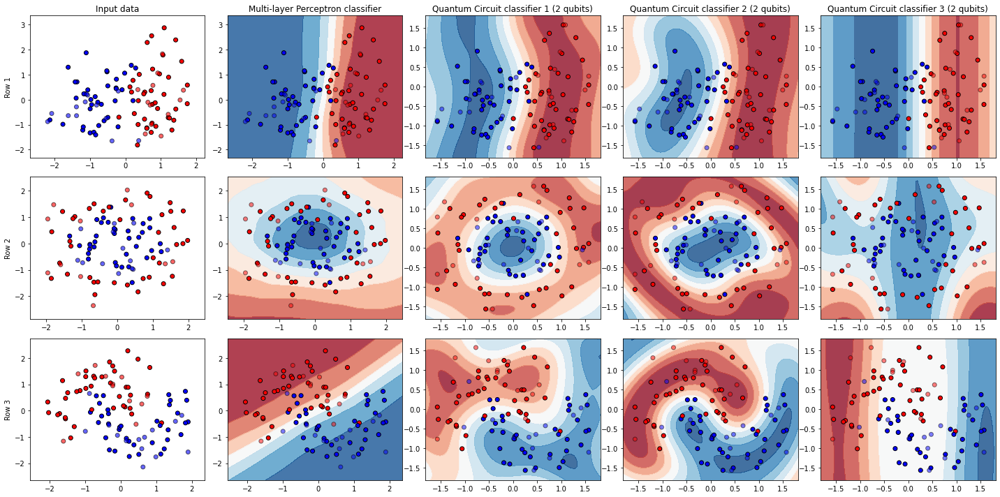

Loop count: 12


C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 0.8795031 | Acc train: 0.7600000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     2 | Cost: 0.8815496 | Acc train: 0.7466667 | Acc val: 0.6000000 | Acc all: 0.7100000 
Iter:     3 | Cost: 0.8838652 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     4 | Cost: 0.8885322 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     5 | Cost: 0.8897932 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     6 | Cost: 0.8877415 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     7 | Cost: 0.8833703 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:     8 | Cost: 0.8755064 | Acc train: 0.7200000 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:     9 | Cost: 0.8679208 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7200000 
Iter:    10 | Cost: 0.8594171 | Acc train: 0.7333333 | Acc val: 0.6000000 | Acc all: 0.7300000 
Iter:    11 | Cost: 0.8488591 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.5101646 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     2 | Cost: 1.5052174 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     3 | Cost: 1.4988820 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     4 | Cost: 1.4914801 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     5 | Cost: 1.4867954 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     6 | Cost: 1.4787400 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5200000 
Iter:     7 | Cost: 1.4677152 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     8 | Cost: 1.4543321 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5300000 
Iter:     9 | Cost: 1.4382862 | Acc train: 0.5200000 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    10 | Cost: 1.4222150 | Acc train: 0.5333333 | Acc val: 0.4800000 | Acc all: 0.5400000 
Iter:    11 | Cost: 1.4072892 | Acc trai

C:\Users\zero\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\zero\anaconda3\lib\site-packages\pennylane\_grad.py:95: UserWarning: Starting with PennyLane v0.20.0, when using Autograd, inputs have to explicitly specify requires_grad=True (or the argnum argument must be passed) in order for trainable parameters to be identified.
  warnings.warn(


Iter:     1 | Cost: 1.2227221 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.5900000 
Iter:     2 | Cost: 1.2239648 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5900000 
Iter:     3 | Cost: 1.2227096 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5900000 
Iter:     4 | Cost: 1.2219627 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5900000 
Iter:     5 | Cost: 1.2202569 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5900000 
Iter:     6 | Cost: 1.2188689 | Acc train: 0.6133333 | Acc val: 0.5600000 | Acc all: 0.5900000 
Iter:     7 | Cost: 1.2185994 | Acc train: 0.6266667 | Acc val: 0.5600000 | Acc all: 0.5900000 
Iter:     8 | Cost: 1.2166878 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.6000000 
Iter:     9 | Cost: 1.2153232 | Acc train: 0.6133333 | Acc val: 0.5200000 | Acc all: 0.6000000 
Iter:    10 | Cost: 1.2142071 | Acc train: 0.6266667 | Acc val: 0.5200000 | Acc all: 0.6000000 
Iter:    11 | Cost: 1.2152979 | Acc trai

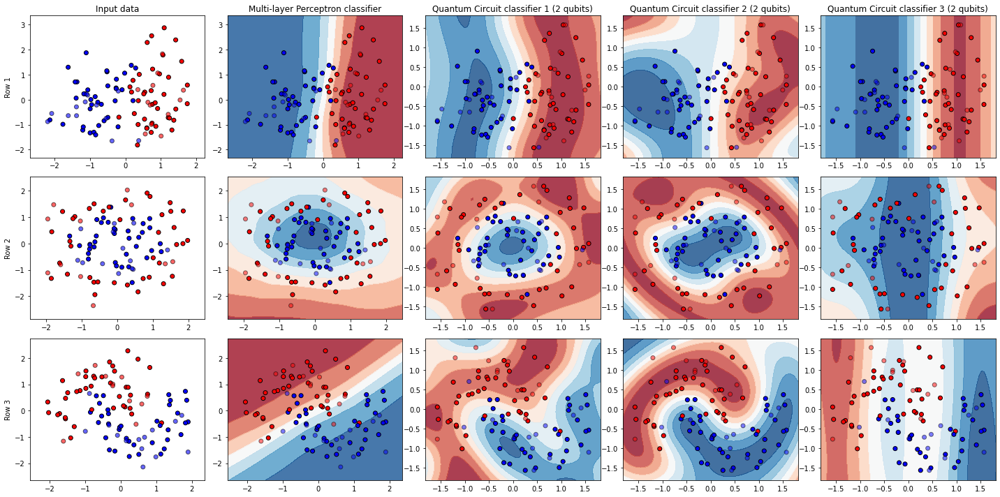

scores: [[[0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]
  [0.96 0.68 0.84]]

 [[0.96 0.92 0.84]
  [0.92 0.96 0.92]
  [0.96 0.84 0.84]
  [0.96 0.88 0.84]
  [0.96 0.84 0.8 ]
  [0.96 0.92 0.84]
  [0.92 0.84 0.76]
  [0.92 0.92 0.84]
  [0.96 0.88 0.88]
  [0.96 0.92 0.92]
  [0.96 0.8  0.92]
  [0.96 0.92 0.92]
  [0.96 0.84 0.88]]

 [[0.96 0.96 0.88]
  [0.96 0.96 0.92]
  [0.96 0.96 0.88]
  [0.96 0.96 0.96]
  [0.96 0.92 0.96]
  [0.96 0.96 0.92]
  [0.96 0.96 0.96]
  [0.92 0.96 0.84]
  [0.92 0.88 0.88]
  [0.92 0.96 0.88]
  [0.96 0.92 0.88]
  [0.92 0.96 0.88]
  [0.92 0.8  0.88]]

 [[0.96 0.72 0.64]
  [0.96 0.76 0.56]
  [0.96 0.76 0.56]
  [0.96 0.72 0.56]
  [0.96 0.6  0.6 ]
  [0.96 0.68 0.64]
  [0.96 0.72 0.56]
  [0.96 0.68 0.56]
  [0.96 0.6  0.56]
  [0.96 0.72 0.56]
  [0.96 0.56 0.52]
  [0.96 0.76 0.56]
  [0.96 0.76 0.56

In [5]:
# h = 0.02  # step size in the mesh
h = 0.03  # step size in the mesh
n_samples = 100

names = [
    "Multi-layer Perceptron classifier",
    # "Linear SVM",
    "Quantum Circuit classifier 1 (2 qubits)",
    "Quantum Circuit classifier 2 (2 qubits)",
    "Quantum Circuit classifier 3 (2 qubits)",
]

classifiers = [
  MLPClassifier(random_state=1, hidden_layer_sizes=(100,100,100), max_iter=max_iterations, 
                    solver="sgd", nesterovs_momentum=True),
  # SVC(kernel="linear", C=0.025),
  [vc_quantum, vc_classifier_1, init_weights_1, circuit_1],
  [vc_quantum, vc_classifier_2, init_weights_2, circuit_2],
  [vc_quantum, vc_classifier_3, init_weights_3, circuit_3],
]

X, y = make_classification(
    n_samples=n_samples,
    n_features=2, n_redundant=0, n_informative=2, random_state=1, n_clusters_per_class=1
)
rng = numpy.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)

datasets = [
    linearly_separable,
    make_circles(n_samples=n_samples, noise=0.2, factor=0.5, random_state=1),
    make_moons(n_samples=n_samples, noise=0.3, random_state=0),
]

# initalize scores array
scores = np.zeros(shape=(len(classifiers),loop_count,len(datasets)))

#############
# Main Loop #
#############
for l_count in range(loop_count):
  print("Loop count:", l_count)
  figure = plt.figure(figsize=(20, 10))
  # Figure: set white background
  figure.patch.set_facecolor('xkcd:white')
  i = 1
  # iterate over datasets
  for ds_cnt, ds in enumerate(datasets):
      # preprocess dataset, split into training and test part
      X, y = ds

      X = StandardScaler().fit_transform(X)
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=0.25, random_state=1
      )

      x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
      y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
      xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
      
      # scale data for quantum data
      y_train_quantum = np.where(y_train==0, y_train-1, y_train)
      y_test_quantum = np.where(y_test==0, y_test-1, y_test)
      y_quantum = np.where(y==0, y-1, y)
      
      scale_value=pi/2
      X_scaled = MinMaxScaler(feature_range=(-scale_value,scale_value), copy=True).fit_transform(X)
      X_train_scaled = MinMaxScaler(feature_range=(-scale_value,scale_value), copy=True).fit_transform(X_train)
      X_test_scaled = MinMaxScaler(feature_range=(-scale_value,scale_value), copy=True).fit_transform(X_test)

      x_min_scaled, x_max_scaled = X_scaled[:, 0].min() - 0.25, X_scaled[:, 0].max() + 0.25
      y_min_scaled, y_max_scaled = X_scaled[:, 1].min() - 0.25, X_scaled[:, 1].max() + 0.25
      xx_scaled, yy_scaled = np.meshgrid(np.arange(x_min_scaled, x_max_scaled, h), np.arange(y_min_scaled, y_max_scaled, h))

      # just plot the dataset first
      cm = plt.cm.RdBu
      cm_bright = ListedColormap(["#FF0000", "#0000FF"])
      ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
      if ds_cnt == 0:
          ax.set_title("Input data")
      ax.set(ylabel='Row ' + str(ds_cnt+1))
      # Plot the training points
      ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors="k")
      # Plot the testing points
      ax.scatter(
          X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6, edgecolors="k"
      )
      ax.set_xlim(xx.min(), xx.max())
      ax.set_ylim(yy.min(), yy.max())
      # ax.set_xticks(())
      # ax.set_yticks(())
      i += 1

      classifier_count=0
      # iterate over classifiers
      for name, clf in zip(names, classifiers):
          
          ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
          
          if 'Quantum' in name:
            # Quantum circuit #
            vars, score = clf[0](clf[1], clf[2], X_train_scaled, X_test_scaled, X_scaled, y_train_quantum, y_test_quantum, y_quantum)
            Z = np.array(
              [clf[1](vars, f) for f in np.c_[xx_scaled.ravel(), yy_scaled.ravel()]]
            )

            # Put the result into a color plot
            Z = Z.reshape(xx_scaled.shape)
            ax.contourf(xx_scaled, yy_scaled, Z, cmap=cm, alpha=0.8)
            
            # Plot the training points
            ax.scatter(
                X_train_scaled[:, 0], X_train_scaled[:, 1], c=y_train_quantum, cmap=cm_bright, edgecolors="k"
            )
            # Plot the testing points
            ax.scatter(
                X_test_scaled[:, 0],
                X_test_scaled[:, 1],
                c=y_test_quantum,
                cmap=cm_bright,
                edgecolors="k",
                alpha=0.5,
            )
            
            ax.set_xlim(xx_scaled.min(), xx_scaled.max())
            ax.set_ylim(yy_scaled.min(), yy_scaled.max())

            # print scores
            # ax.text(
            #   xx_scaled.max() - 0.15,
            #   yy_scaled.min() + 0.15,
            #   ("Score: %.2f" % score).lstrip("0"),
            #   size=15,
            #   horizontalalignment="right",
            # )
            
          else:
            # Classical circuits #
            clf.fit(X_train, y_train)
            score = clf.score(X_test, y_test)

            # Plot the decision boundary. For that, we will assign a color to each
            # point in the mesh [x_min, x_max]x[y_min, y_max].
            if hasattr(clf, "decision_function"):
                Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
            else:
                Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

            # Put the result into a color plot
            Z = Z.reshape(xx.shape)
            ax.contourf(xx, yy, Z, cmap=cm, alpha=0.8)
                
            # Plot the training points
            ax.scatter(
                X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors="k"
            )
            # Plot the testing points
            ax.scatter(
                X_test[:, 0],
                X_test[:, 1],
                c=y_test,
                cmap=cm_bright,
                edgecolors="k",
                alpha=0.5,
            )

            ax.set_xlim(xx.min(), xx.max())
            ax.set_ylim(yy.min(), yy.max())

            # print scores
            # ax.text(
            #     xx.max() - 0.3,
            #     yy.min() + 0.3,
            #     ("Score: %.2f" % score).lstrip("0"),
            #     size=15,
            #     horizontalalignment="right",
            # )
            
          scores[classifier_count][l_count][ds_cnt] = score
          # ax.set_xticks(())
          # ax.set_yticks(())
          if ds_cnt == 0:
              ax.set_title(name)
          i += 1
          classifier_count += 1

  plt.tight_layout()
  plt.show()

print("scores:", scores)


In [6]:
for name, clf in zip(names, classifiers):
    if 'Quantum' in name:
      print(name)
      print(clf[3].draw())


Quantum Circuit classifier 1 (2 qubits)
 0: ──H──RY(1.81)──╭C──Rot(0.614, -0.67, -0.128)──╭C──RY(1.81)──╭C──Rot(0.222, 0.713, -0.3)────╭C──RY(1.81)──╭C──Rot(1.02, 0.629, -0.00815)──────╭C──┤ ⟨Z⟩ 
 1: ──H──RY(1.81)──╰X──Rot(-1.28, 1.01, -0.223)───╰X──RY(1.81)──╰X──Rot(-0.343, 0.314, 0.318)──╰X──RY(1.81)──╰X──Rot(0.0121, 0.00908, -0.00126)──╰X──┤     

Quantum Circuit classifier 2 (2 qubits)
 0: ──H──RY(1.81)──RX(1.81)──╭C──Rot(-0.538, -0.294, -0.37)────────╭C──RY(1.81)──RX(1.81)──╭C──Rot(0.0468, 1.14, -0.461)──────────╭C──RY(1.81)──RX(1.81)──╭C──Rot(0.24, -0.882, -0.0133)───╭C──┤ ⟨Z⟩ 
 1: ──H──────────────────────╰X──Rot(-0.00372, 0.000968, 0.00376)──╰X──────────────────────╰X──Rot(-0.00463, -0.000349, 0.00479)──╰X──────────────────────╰X──Rot(0.00452, 0.0111, 0.012)──╰X──┤     

Quantum Circuit classifier 3 (2 qubits)
 0: ──H──RY(1.81)──╭C──Rot(-1, -0.0524, -0.852)─────╭C──RY(1.81)──╭C──Rot(-0.158, 0.0199, -0.284)──╭C──RY(1.81)──╭C──Rot(0.132, -0.0368, 0.00107)─────╭C──┤ ⟨Z⟩ 
 1: ──H──

C:\Users\zero\anaconda3\lib\site-packages\pennylane\qnode.py:838: UserWarning: The QNode.draw method has been deprecated. Please use the qml.draw(qnode)(*args) function instead.
  warnings.warn(
